In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
%matplotlib inline
import os
import ydata_profiling as pf
import seaborn as sns 
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split ,GridSearchCV
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import pickle

In [2]:
os.chdir('F:\\boston')

##  Lets load the Boston House Pricing Dataset

In [3]:
df =pd.read_csv('housing.csv')
df

,0.00632 18.00 2.310 0 0.5380 6.5750 65.20 4.0900 1 296.0 15.30 396.90 4.98 24.00
0,0.02731 0.00 7.070 0 0.4690 6.4210 78...
1,0.02729 0.00 7.070 0 0.4690 7.1850 61...
2,0.03237 0.00 2.180 0 0.4580 6.9980 45...
3,0.06905 0.00 2.180 0 0.4580 7.1470 54...
4,0.02985 0.00 2.180 0 0.4580 6.4300 58...
...,...
500,0.06263 0.00 11.930 0 0.5730 6.5930 69...
501,0.04527 0.00 11.930 0 0.5730 6.1200 76...
502,0.06076 0.00 11.930 0 0.5730 6.9760 91...
503,0.10959 0.00 11.930 0 0.5730 6.7940 89...


In [4]:
from sklearn.datasets import load_boston

In [5]:
boston_df =load_boston()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (

In [6]:
def clean_dataset(input_file, output_file, separator=','):
    with open(input_file, 'r') as f:
        lines = f.readlines()

    cleaned_data = []
    for line in lines:
        # Remove leading/trailing whitespaces and split values by spaces
        values = line.strip().split()
        # Join the values using the specified separator
        cleaned_line = separator.join(values)
        cleaned_data.append(cleaned_line)

    with open(output_file, 'w') as f:
        f.write("\n".join(cleaned_data))

# Replace 'dataset.txt' with the path to your input file
input_file_path = 'housing.csv'

# Replace 'cleaned_dataset.txt' with the desired output file path
output_file_path = 'cleaned_dataset.csv'

# Call the function to clean the dataset with commas as separators
clean_dataset(input_file_path, output_file_path, separator=',')


In [7]:
clean_dataset(input_file_path, output_file_path, separator=';')


In [8]:
pd.read_csv('cleaned_dataset.csv')

,0.00632;18.00;2.310;0;0.5380;6.5750;65.20;4.0900;1;296.0;15.30;396.90;4.98;24.00
0,0.02731;0.00;7.070;0;0.4690;6.4210;78.90;4.967...
1,0.02729;0.00;7.070;0;0.4690;7.1850;61.10;4.967...
2,0.03237;0.00;2.180;0;0.4580;6.9980;45.80;6.062...
3,0.06905;0.00;2.180;0;0.4580;7.1470;54.20;6.062...
4,0.02985;0.00;2.180;0;0.4580;6.4300;58.70;6.062...
...,...
500,0.06263;0.00;11.930;0;0.5730;6.5930;69.10;2.47...
501,0.04527;0.00;11.930;0;0.5730;6.1200;76.70;2.28...
502,0.06076;0.00;11.930;0;0.5730;6.9760;91.00;2.16...
503,0.10959;0.00;11.930;0;0.5730;6.7940;89.30;2.38...


In [9]:
df =pd.read_csv('housing.csv')
df

,0.00632 18.00 2.310 0 0.5380 6.5750 65.20 4.0900 1 296.0 15.30 396.90 4.98 24.00
0,0.02731 0.00 7.070 0 0.4690 6.4210 78...
1,0.02729 0.00 7.070 0 0.4690 7.1850 61...
2,0.03237 0.00 2.180 0 0.4580 6.9980 45...
3,0.06905 0.00 2.180 0 0.4580 7.1470 54...
4,0.02985 0.00 2.180 0 0.4580 6.4300 58...
...,...
500,0.06263 0.00 11.930 0 0.5730 6.5930 69...
501,0.04527 0.00 11.930 0 0.5730 6.1200 76...
502,0.06076 0.00 11.930 0 0.5730 6.9760 91...
503,0.10959 0.00 11.930 0 0.5730 6.7940 89...


In [10]:
import csv

def clean_csv_dataset(input_file, output_file, delimiter=','):
    with open(input_file, 'r') as f:
        reader = csv.reader(f, delimiter=' ')

        cleaned_data = []
        for row in reader:
            # Join the values using the specified delimiter
            cleaned_row = delimiter.join(row)
            cleaned_data.append(cleaned_row)

    with open(output_file, 'w', newline='') as f:
        writer = csv.writer(f, delimiter=delimiter)
        writer.writerows(cleaned_data)

# Replace 'dataset.csv' with the path to your input CSV file
input_file_path = 'housing.csv'

# Replace 'cleaned_dataset.csv' with the desired output file path
output_file_path = 'cleaned_housing.csv'

# Call the function to clean the CSV dataset with commas as delimiters
clean_csv_dataset(input_file_path, output_file_path, delimiter=',')


In [11]:
clean_csv_dataset(input_file_path, output_file_path, delimiter=';')


In [12]:
df =pd.read_csv('cleaned_housing.csv')
df

,";;0;.;0;0;6;3;2;"";"";"";"";1;8;.;0;0;"";"";"";"";"";"";2;.;3;1;0;"";"";"";"";0;"";"";"";"";0;.;5;3;8;0;"";"";"";"";6;.;5;7;5;0;"";"";"";"";6;5;.;2;0;"";"";"";"";4;.;0;9;0;0;"";"";"";"";"";"";1;"";"";"";"";2;9;6;.;0;"";"";"";"";1;5;.;3;0;"";"";3;9;6;.;9;0;"";"";"";"";"";"";4;.;9;8;"";"";"";"";2;4;.;0;0"
0,";;0;.;0;2;7;3;1;"";"";"";"";"";"";0;.;0;0;"";"";"";"";"";..."
1,";;0;.;0;2;7;2;9;"";"";"";"";"";"";0;.;0;0;"";"";"";"";"";..."
2,";;0;.;0;3;2;3;7;"";"";"";"";"";"";0;.;0;0;"";"";"";"";"";..."
3,";;0;.;0;6;9;0;5;"";"";"";"";"";"";0;.;0;0;"";"";"";"";"";..."
4,";;0;.;0;2;9;8;5;"";"";"";"";"";"";0;.;0;0;"";"";"";"";"";..."
...,...
500,";;0;.;0;6;2;6;3;"";"";"";"";"";"";0;.;0;0;"";"";"";"";1;..."
501,";;0;.;0;4;5;2;7;"";"";"";"";"";"";0;.;0;0;"";"";"";"";1;..."
502,";;0;.;0;6;0;7;6;"";"";"";"";"";"";0;.;0;0;"";"";"";"";1;..."
503,";;0;.;1;0;9;5;9;"";"";"";"";"";"";0;.;0;0;"";"";"";"";1;..."


In [13]:
df=pd.read_excel('boston price.xlsx')
df

,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9,Column10,Column11,Column12,Column13,Column14
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [14]:
display(df.columns)

Index(['Column1', 'Column2', 'Column3', 'Column4', 'Column5', 'Column6',
       'Column7', 'Column8', 'Column9', 'Column10', 'Column11', 'Column12',
       'Column13', 'Column14'],
      dtype='object')

#### Renaming the column names

In [15]:
df = df.rename(columns={'Column1':'CRIM','Column2':'ZN', 'Column3':'INDUS','Column4':'CHAS','Column5':'NOX','Column6':'RM',
                      'Column7':'AGE','Column8':'DIS','Column9':'RAD','Column10':'TAX','Column11':'PTRATIO','Column12':'B'
                       ,'Column13':'LSTAT','Column14':'Price'})
display (df.columns)

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'Price'],
      dtype='object')

In [16]:
display (df)


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [17]:
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [18]:
print(df.describe)

<bound method NDFrame.describe of         CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD  TAX  \
0    0.00632  18.0   2.31     0  0.538  6.575  65.2  4.0900    1  296   
1    0.02731   0.0   7.07     0  0.469  6.421  78.9  4.9671    2  242   
2    0.02729   0.0   7.07     0  0.469  7.185  61.1  4.9671    2  242   
3    0.03237   0.0   2.18     0  0.458  6.998  45.8  6.0622    3  222   
4    0.06905   0.0   2.18     0  0.458  7.147  54.2  6.0622    3  222   
..       ...   ...    ...   ...    ...    ...   ...     ...  ...  ...   
501  0.06263   0.0  11.93     0  0.573  6.593  69.1  2.4786    1  273   
502  0.04527   0.0  11.93     0  0.573  6.120  76.7  2.2875    1  273   
503  0.06076   0.0  11.93     0  0.573  6.976  91.0  2.1675    1  273   
504  0.10959   0.0  11.93     0  0.573  6.794  89.3  2.3889    1  273   
505  0.04741   0.0  11.93     0  0.573  6.030  80.8  2.5050    1  273   

     PTRATIO       B  LSTAT  Price  
0       15.3  396.90   4.98   24.0  
1       17.8  3

In [19]:
df.isna().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
Price      0
dtype: int64

In [20]:
df.duplicated().sum()

0

In [21]:
df.shape

(506, 14)

In [22]:
pf.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Preparing Dataset

In [23]:
df= pd.DataFrame(df)

In [24]:
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [25]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  Price    506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


## summerizing the dataset

In [27]:
df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


## Check the missing values

In [28]:
df.isna().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
Price      0
dtype: int64

### Exploratory Data Analysis EDA
#### Correlation

In [29]:
df.corr()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


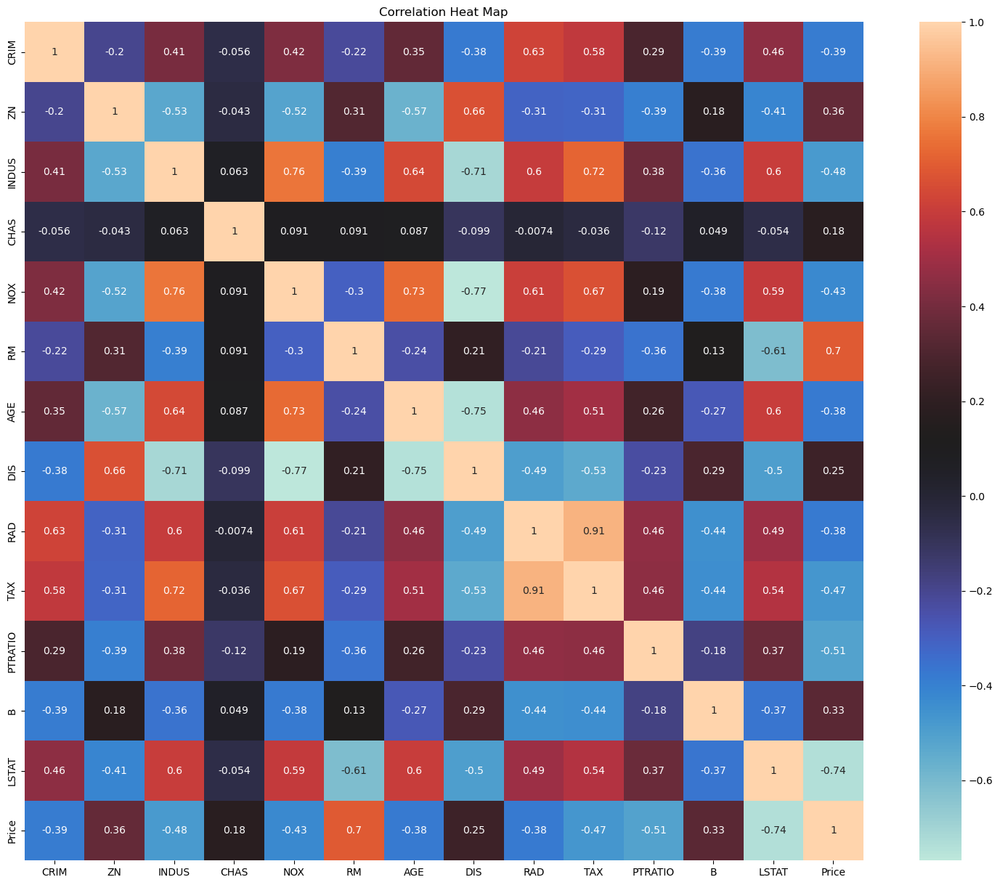

In [30]:
plt.rcParams['figure.figsize']=(20,15)
sns.heatmap(df.corr(),annot = True, cmap = 'icefire',square = True,cbar = True)
plt.title('Correlation Heat Map')
plt.savefig('Correlation Heat Map.png')
plt.show()

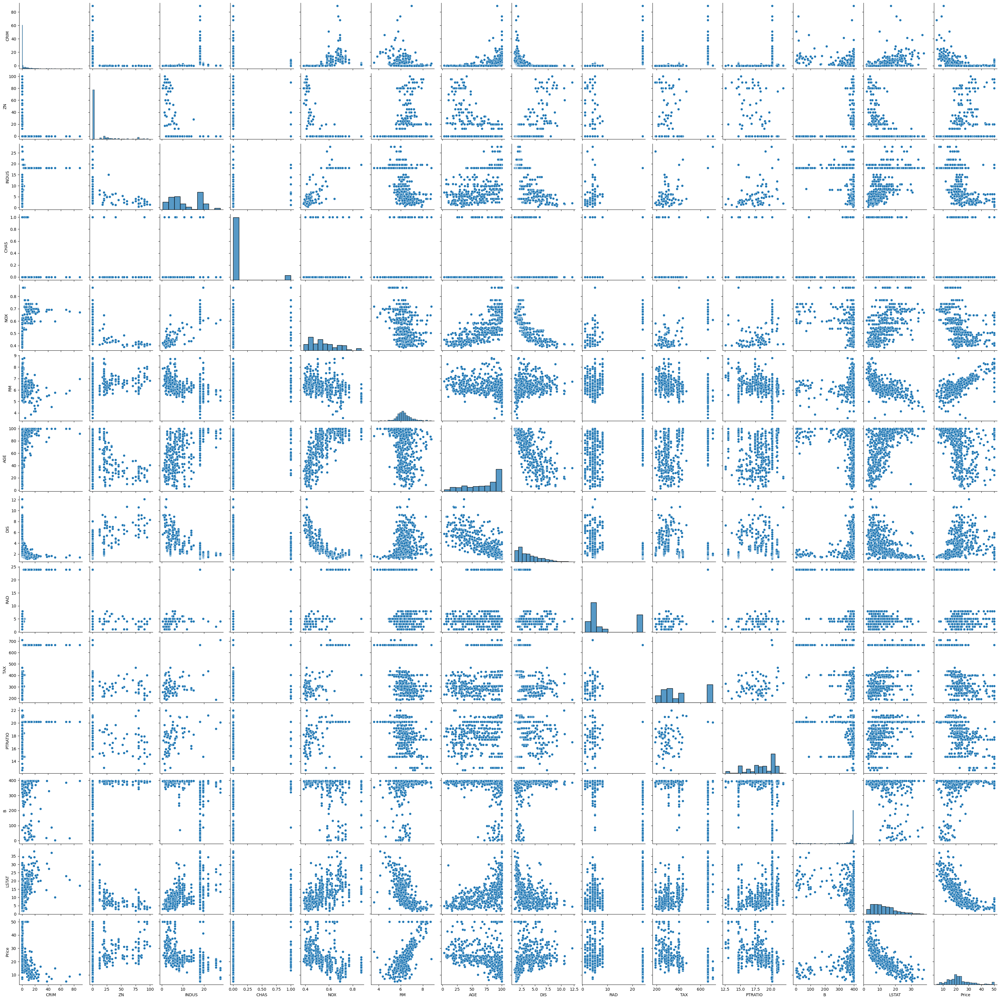

In [31]:
sns.pairplot(df)

Text(0, 0.5, 'Price')

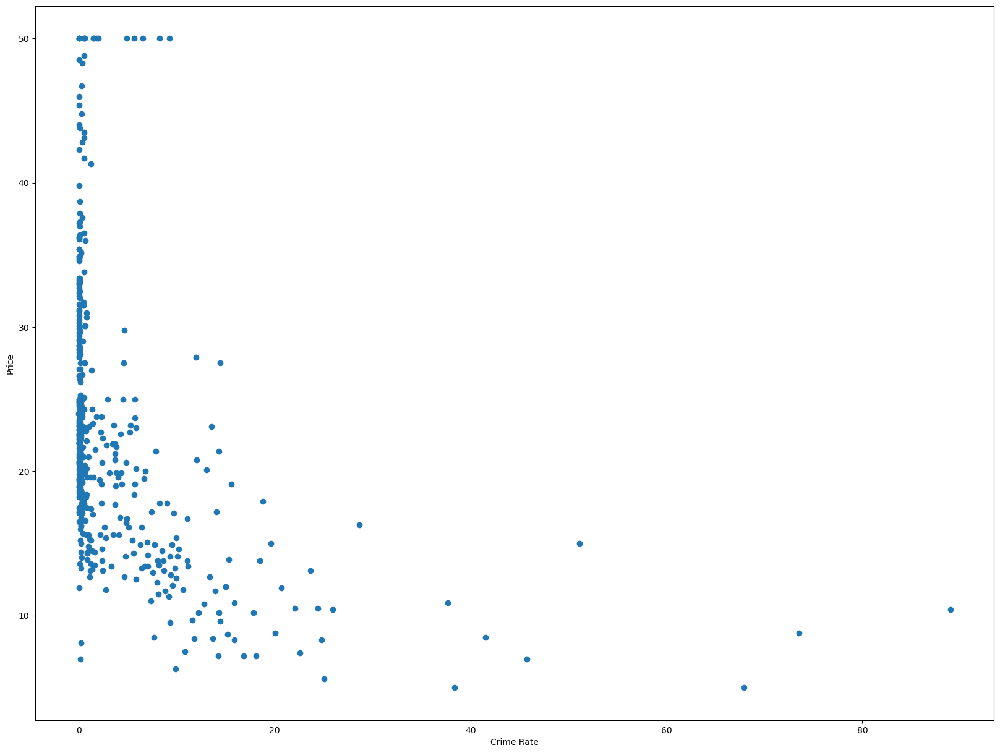

In [32]:
plt.scatter(df['CRIM'],df['Price'])
plt.xlabel('Crime Rate')
plt.ylabel('Price')

Text(0, 0.5, 'Price')

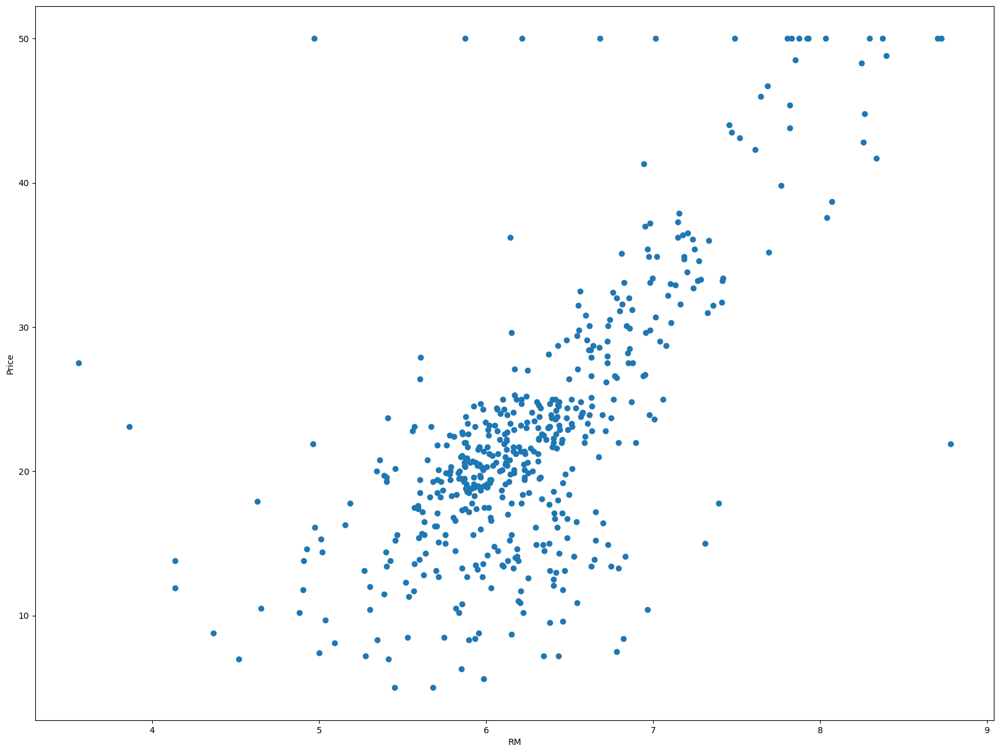

In [33]:
plt.scatter(df['RM'],df['Price'])
plt.xlabel('RM')
plt.ylabel('Price')

<AxesSubplot:xlabel='RM', ylabel='Price'>

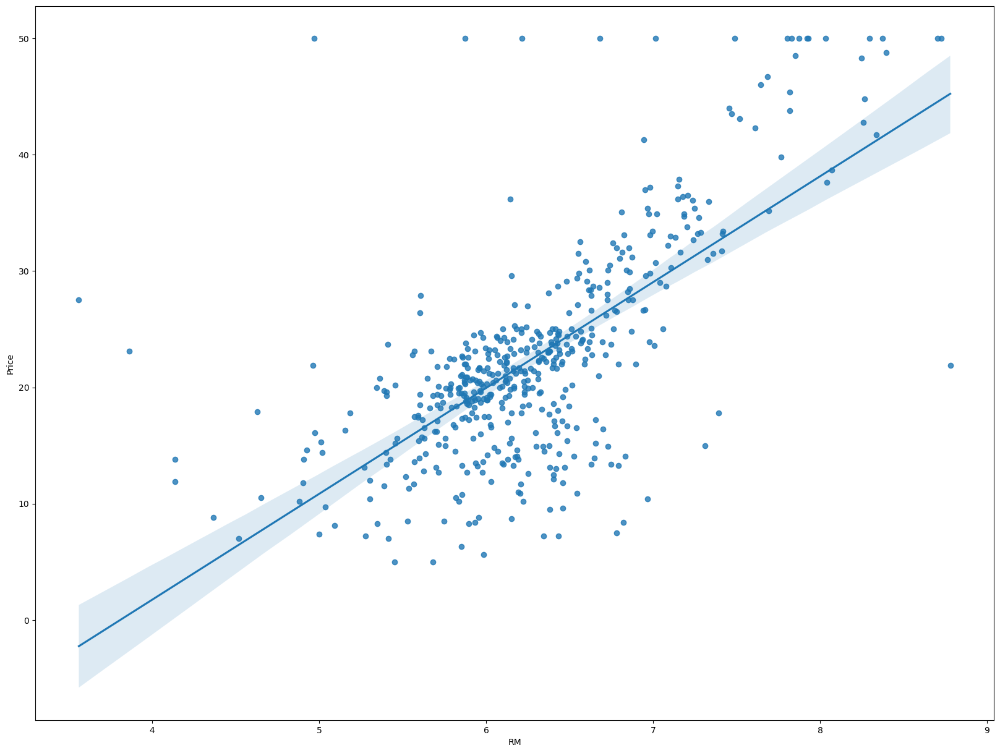

In [34]:
sns.regplot(x='RM',y='Price',data=df)

<AxesSubplot:xlabel='LSTAT', ylabel='Price'>

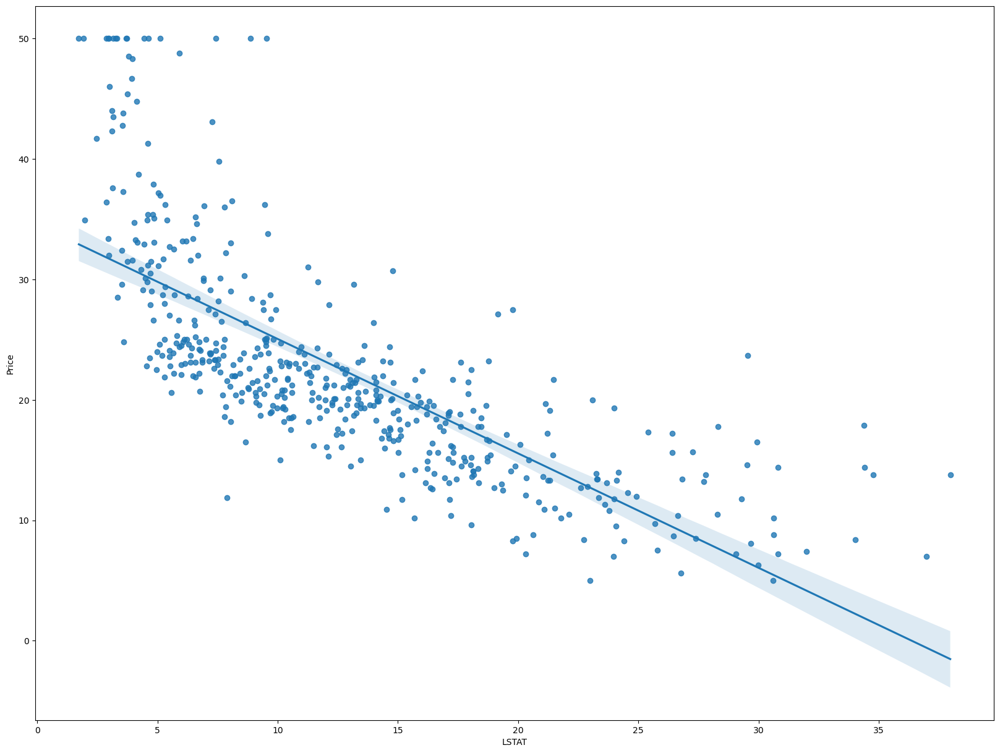

In [35]:
sns.regplot(x='LSTAT',y='Price',data=df)

<AxesSubplot:xlabel='CHAS', ylabel='Price'>

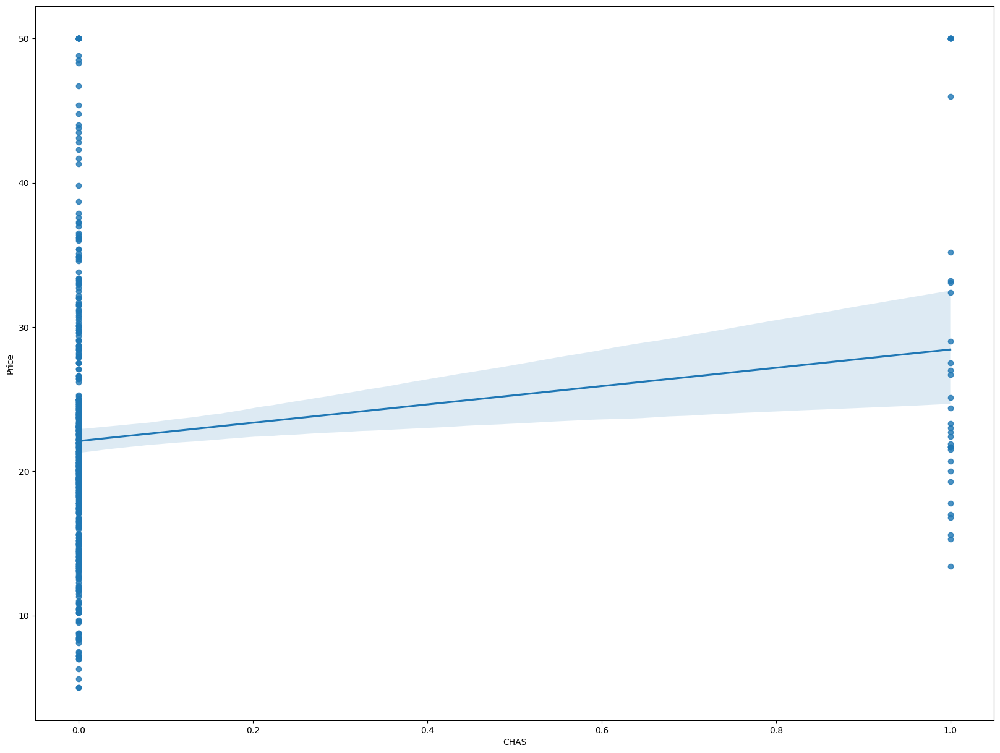

In [36]:
sns.regplot(x='CHAS',y='Price',data=df)

<AxesSubplot:xlabel='PTRATIO', ylabel='Price'>

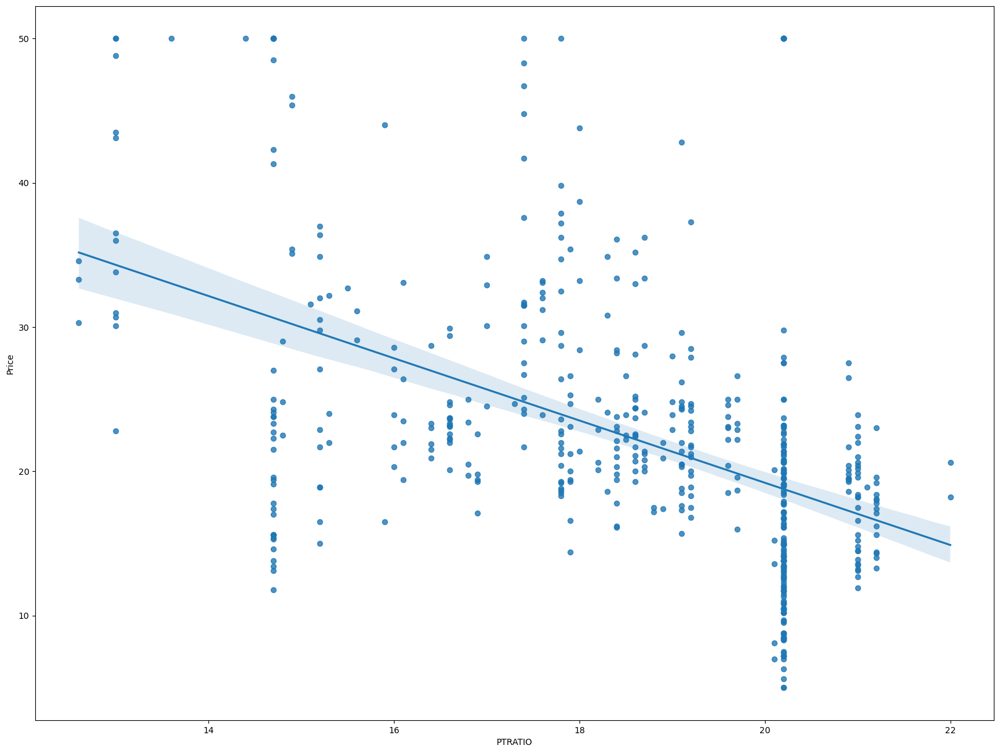

In [37]:
sns.regplot(x='PTRATIO',y='Price',data=df)

#### Independent and Dependent Feature

In [76]:
x=df.iloc[:,:-1]
y=df.iloc[:,-1]

In [39]:
x.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33


In [40]:
y

0      24.0
1      21.6
2      34.7
3      33.4
4      36.2
       ... 
501    22.4
502    20.6
503    23.9
504    22.0
505    11.9
Name: Price, Length: 506, dtype: float64

### Train Test Split

In [41]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest =train_test_split(x,y,test_size=0.3,random_state=42)


In [42]:
xtrain

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
5,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21
116,0.13158,0.0,10.01,0,0.547,6.176,72.5,2.7301,6,432,17.8,393.30,12.04
45,0.17142,0.0,6.91,0,0.448,5.682,33.8,5.1004,3,233,17.9,396.90,10.21
16,1.05393,0.0,8.14,0,0.538,5.935,29.3,4.4986,4,307,21.0,386.85,6.58
468,15.57570,0.0,18.10,0,0.580,5.926,71.0,2.9084,24,666,20.2,368.74,18.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.17120,0.0,8.56,0,0.520,5.836,91.9,2.2110,5,384,20.9,395.67,18.66
270,0.29916,20.0,6.96,0,0.464,5.856,42.1,4.4290,3,223,18.6,388.65,13.00
348,0.01501,80.0,2.01,0,0.435,6.635,29.7,8.3440,4,280,17.0,390.94,5.99
435,11.16040,0.0,18.10,0,0.740,6.629,94.6,2.1247,24,666,20.2,109.85,23.27


In [43]:
xtest

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
173,0.09178,0.0,4.05,0,0.510,6.416,84.1,2.6463,5,296,16.6,395.50,9.04
274,0.05644,40.0,6.41,1,0.447,6.758,32.9,4.0776,4,254,17.6,396.90,3.53
491,0.10574,0.0,27.74,0,0.609,5.983,98.8,1.8681,4,711,20.1,390.11,18.07
72,0.09164,0.0,10.81,0,0.413,6.065,7.8,5.2873,4,305,19.2,390.91,5.52
452,5.09017,0.0,18.10,0,0.713,6.297,91.8,2.3682,24,666,20.2,385.09,17.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,9.72418,0.0,18.10,0,0.740,6.406,97.2,2.0651,24,666,20.2,385.96,19.52
23,0.98843,0.0,8.14,0,0.538,5.813,100.0,4.0952,4,307,21.0,394.54,19.88
225,0.52693,0.0,6.20,0,0.504,8.725,83.0,2.8944,8,307,17.4,382.00,4.63
433,5.58107,0.0,18.10,0,0.713,6.436,87.9,2.3158,24,666,20.2,100.19,16.22


#### Standardizing the dataset

In [44]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
xtrain=scaler.fit_transform(xtrain)

In [45]:
xtest = scaler.transform(xtest)

In [46]:
xtrain

array([[-0.41425879, -0.50512499, -1.29214218, ...,  0.18727079,
         0.39651419, -1.01531611],
       [-0.40200818, -0.50512499, -0.16208345, ..., -0.21208981,
         0.3870674 , -0.05366252],
       [-0.39721053, -0.50512499, -0.60948856, ..., -0.16771641,
         0.42854113, -0.31132373],
       ...,
       [-0.41604586,  3.03838247, -1.3166773 , ..., -0.56707702,
         0.35987906, -0.90549329],
       [ 0.92611293, -0.50512499,  1.00549958, ...,  0.8528718 ,
        -2.87841346,  1.52750437],
       [-0.39030549, -0.50512499, -0.37135358, ...,  1.16348561,
        -3.32828832, -0.25218837]])

In [47]:
xtest

array([[-0.406801  , -0.50512499, -1.02225586, ..., -0.74457062,
         0.41241246, -0.47605794],
       [-0.41105674,  1.26662874, -0.68165068, ..., -0.30083661,
         0.42854113, -1.25185755],
       [-0.4051199 , -0.50512499,  2.39678516, ...,  0.8084984 ,
         0.35031705,  0.79535229],
       ...,
       [-0.35439903, -0.50512499, -0.71195877, ..., -0.38958342,
         0.25688594, -1.09697922],
       [ 0.25423453, -0.50512499,  1.00549958, ...,  0.8528718 ,
        -2.98970133,  0.53487511],
       [ 0.77732457, -0.50512499,  1.00549958, ...,  0.8528718 ,
         0.33199949,  0.56585078]])

## Model Training

In [48]:
from sklearn.linear_model import LinearRegression
lr= LinearRegression()
lr.fit(xtrain,ytrain)

LinearRegression()

#### Print the Coefficients and the intercept

In [49]:
print(lr.coef_)

[-1.10834602  0.80843998  0.34313466  0.81386426 -1.79804295  2.913858
 -0.29893918 -2.94251148  2.09419303 -1.44706731 -2.05232232  1.02375187
 -3.88579002]


In [50]:
print(lr.intercept_)

23.01581920903955


In [51]:
lr.get_params()

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False}

#### Prediction with Test data

In [52]:
ypred = lr.predict(xtest)
ypred

array([28.64896005, 36.49501384, 15.4111932 , 25.40321303, 18.85527988,
       23.14668944, 17.3921241 , 14.07859899, 23.03692679, 20.59943345,
       24.82286159, 18.53057049, -6.86543527, 21.80172334, 19.22571177,
       26.19191985, 20.27733882,  5.61596432, 40.44887974, 17.57695918,
       27.44319095, 30.1715964 , 10.94055823, 24.02083139, 18.07693812,
       15.934748  , 23.12614028, 14.56052142, 22.33482544, 19.3257627 ,
       22.16564973, 25.19476081, 25.31372473, 18.51345025, 16.6223286 ,
       17.50268505, 30.94992991, 20.19201752, 23.90440431, 24.86975466,
       13.93767876, 31.82504715, 42.56978796, 17.62323805, 27.01963242,
       17.19006621, 13.80594006, 26.10356557, 20.31516118, 30.08649576,
       21.3124053 , 34.15739602, 15.60444981, 26.11247588, 39.31613646,
       22.99282065, 18.95764781, 33.05555669, 24.85114223, 12.91729352,
       22.68101452, 30.80336295, 31.63522027, 16.29833689, 21.07379993,
       16.57699669, 20.36362023, 26.15615896, 31.06833034, 11.98

### Assumptions
#### Scatter plot for Prediction

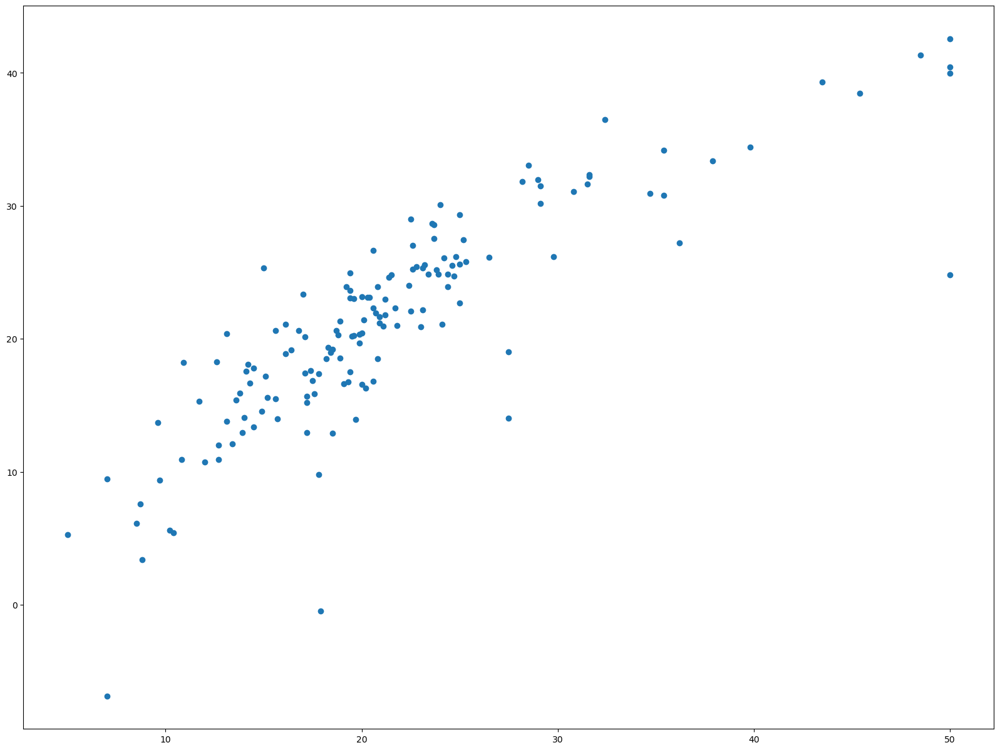

In [53]:
plt.scatter(ytest,ypred)

#### Residuals

In [54]:
residuals = ytest-ypred
residuals

173    -5.048960
274    -4.095014
491    -1.811193
72     -2.603213
452    -2.755280
         ...    
441    -0.303672
23      1.114059
225    10.016575
433    -2.382863
447    -5.685618
Name: Price, Length: 152, dtype: float64

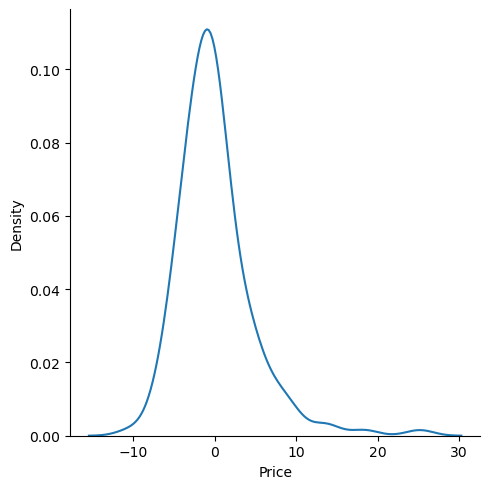

In [55]:
sns.displot(residuals,kind='kde')

#### Scatterplot withn respect to prediction and residuals

Uniform Distribution


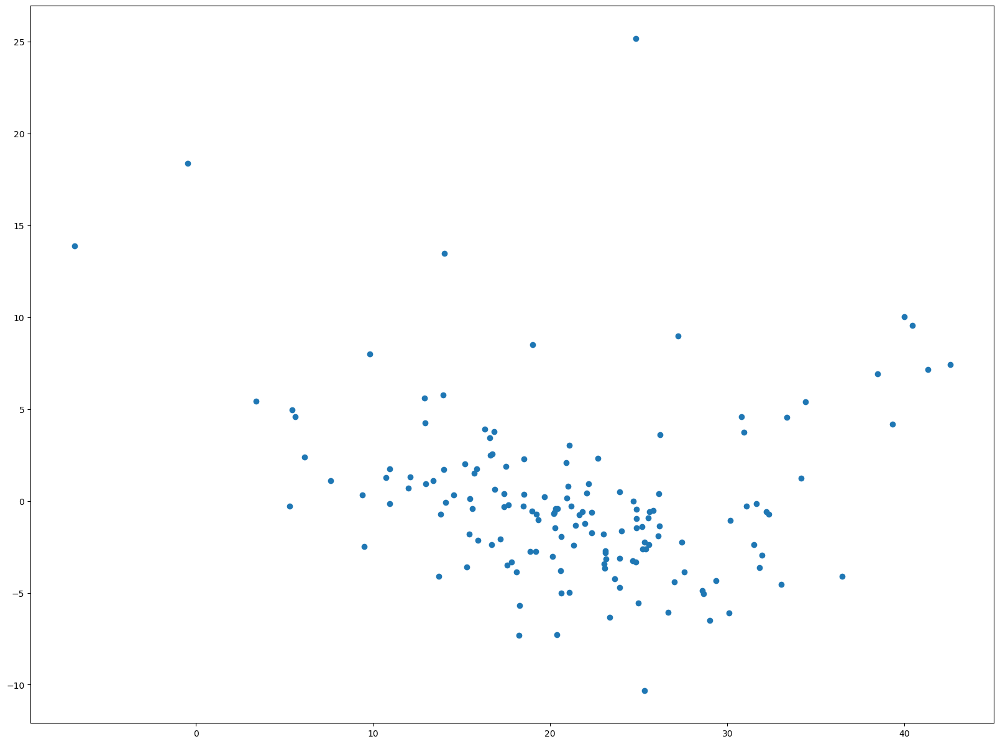

In [56]:
plt.scatter(ypred,residuals)
print('Uniform Distribution')

In [57]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print(mean_absolute_error(ytest,ypred))
print(mean_squared_error(ytest,ypred))
print(np.sqrt(mean_squared_error(ytest,ypred)))


3.162709871457405
21.5174442311772
4.63868992617282


#### R square and Adjusted R square

In [58]:
from sklearn.metrics import r2_score
score = r2_score(ytest,ypred)
print(score)

0.7112260057484934


In [59]:
1 - (1-score)*(len(ytest)-1)/(len(ytest)-xtest.shape[1]-1)

0.6840226584639312

In [82]:
x=df.iloc[:,:-1]
y=df.iloc[:,-1]

# Model Fitting:
#### Defining the Function for the ML algorithms using GridSearchCV Algorithm and splitting the dependent variable & independent variable into training and test dataset and Predicting the Dependent Variable by fitting the given model and create the pickle file of the model with the given Algo_name.  Further getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset.

In [84]:
x

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48


In [85]:
y

0      24.0
1      21.6
2      34.7
3      33.4
4      36.2
       ... 
501    22.4
502    20.6
503    23.9
504    22.0
505    11.9
Name: Price, Length: 506, dtype: float64

In [107]:
def FitModel(x,y,algo_name,algorithm,GridSearchParams,cv):
    np.random.seed(10)
    xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size = 0.2,random_state = 44)
    grid = GridSearchCV(estimator = algorithm,param_grid = GridSearchParams,cv = cv,
                     scoring = 'r2',verbose = 0, n_jobs = -1)
    grid_result = grid.fit(xtrain,ytrain)
    best_params = grid_result.best_params_
    pred = grid_result.predict(xtest)
    pickle.dump(grid_result,open(algo_name,'wb'))
    print('Algorithm Name:\t',algo_name)
    print('Best Params:',best_params)
    print('R2 Score : {}%'.format(100* r2_score(ytest,pred)))   

#### Running the function with empty parameters since the Linear Regression model doesn't need any special parameters and fitting the Linear Regression Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Linear Regression

In [109]:
param = {}
FitModel(x,y,'Linear Regression',LinearRegression(),param,cv=10)

Algorithm Name:	 Linear Regression
Best Params: {}
R2 Score : 75.21800808693153%


#### Running the function with empty parameters since the Lasso model doesn't need any special parameters and fitting the Lasso Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Lasso.

In [110]:
param = {}
FitModel(x,y,'Lasso ',Lasso(),param,cv=10)

Algorithm Name:	 Lasso 
Best Params: {}
R2 Score : 68.5587949566005%


#### Running the function with empty parameters since the Ridge model doesn't need any special parameters and fitting the Ridge Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Ridge.

In [111]:
param ={}
FitModel(x,y,'Ridge',Ridge(),param,cv=10)

Algorithm Name:	 Ridge
Best Params: {}
R2 Score : 75.39303499010774%


#### Running the function with some appropriate parameters and fitting the Decision Tree Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Decision Tree.

In [112]:
 "max_features":['auto','sqrt'],
          "max_depth":[int(x) for x in np.linspace(6, 45, num = 5)],
          "min_samples_leaf":[1,2,5,10],
          "min_samples_split":[2, 5, 10, 15, 100],
          "min_weight_fraction_leaf":[0.0,0.1,0.2,0.3,0.4,0.5]

SyntaxError: illegal target for annotation (2845128526.py, line 1)

In [113]:
param= {'max_features':['auto','sqrt'],
       'max_depth':[int(x) for x in np.linspace(6,45,num=5)],
       'min_samples_leaf':[1,2,5,10],
       'min_samples_split':[2,5,10,15,100],
       'min_weight_fraction_leaf':[0.0,0.1,0.2,0.3,0.4,0.5]}

FitModel(x,y,'Decision Tree',DecisionTreeRegressor(),param,cv=10)

Algorithm Name:	 Decision Tree
Best Params: {'max_depth': 6, 'max_features': 'auto', 'min_samples_leaf': 10, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0}
R2 Score : 78.65487099809444%


In [114]:
param = { "max_features":['auto','sqrt'],
          "max_depth":[int(x) for x in np.linspace(6, 45, num = 5)],
          "min_samples_leaf":[1,2,5,10],
          "min_samples_split":[2, 5, 10, 15, 100],
          "min_weight_fraction_leaf":[0.0,0.1,0.2,0.3,0.4,0.5]}

FitModel(x,y,'Decision Tree',DecisionTreeRegressor(),param,cv=10)

Algorithm Name:	 Decision Tree
Best Params: {'max_depth': 35, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0}
R2 Score : 82.78891494700117%


In [115]:
param={}
FitModel(x,y,'DecisionTree',DecisionTreeRegressor(),param,cv=10)

Algorithm Name:	 DecisionTree
Best Params: {}
R2 Score : 83.38694427164583%


#### Running the function with some appropriate parameters and fitting the Random Forest Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Random Forest.



In [116]:
param = {'n_estimators':[500,600,800,1000],
         "criterion":["squared_error", "absolute_error", "poisson"]}

In [117]:
param={}
FitModel(x,y,'Random Forest',RandomForestRegressor(),param,cv=10)

Algorithm Name:	 Random Forest
Best Params: {}
R2 Score : 89.34006350199333%


In [119]:
param ={'n_estimators':[500,600,800,1000],
       'criterion':['squared_error','absolute_error','poisson']}
FitModel(x,y,'Random Forest',RandomForestRegressor(),param,cv=10)

Algorithm Name:	 Random Forest
Best Params: {'criterion': 'squared_error', 'n_estimators': 1000}
R2 Score : 89.2854301270153%


#### Running the function with some appropriate parameters and fitting the Extra Trees Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Extra Trees.



In [120]:
param = { 'n_estimators':[500,600,800,1000],
        'max_features':['auto','sqrt']}
FitModel(x,y,'Extra Trees',ExtraTreesRegressor(),param,cv=10)

Algorithm Name:	 Extra Trees
Best Params: {'max_features': 'sqrt', 'n_estimators': 800}
R2 Score : 88.9893864604949%


#### Running the function with some appropriate parameters and fitting the XGBoost Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name XGBoost.




In [124]:
param={'n_estimators':[111,222,333,444]}
FitModel(x,y,'XGBoost',XGBRegressor(),param,cv=10)

Algorithm Name:	 XGBoost
Best Params: {'n_estimators': 111}
R2 Score : 89.02521641133266%


#### Running the function with empty parameters since the CatBoost Regressor model doesn't need any special parameters and fitting the CatBoost Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name CatBoost.



In [125]:
param={}
FitModel(x,y,'Catboost',CatBoostRegressor(),param,cv=10)

Learning rate set to 0.03548
0:	learn: 8.9841298	total: 142ms	remaining: 2m 22s
1:	learn: 8.8002186	total: 145ms	remaining: 1m 12s
2:	learn: 8.6060754	total: 147ms	remaining: 48.8s
3:	learn: 8.4494222	total: 149ms	remaining: 37.1s
4:	learn: 8.3012903	total: 151ms	remaining: 30.1s
5:	learn: 8.1399457	total: 154ms	remaining: 25.5s
6:	learn: 7.9889201	total: 156ms	remaining: 22.1s
7:	learn: 7.8318994	total: 158ms	remaining: 19.6s
8:	learn: 7.6830048	total: 160ms	remaining: 17.6s
9:	learn: 7.5333318	total: 162ms	remaining: 16.1s
10:	learn: 7.3791754	total: 164ms	remaining: 14.8s
11:	learn: 7.2443901	total: 166ms	remaining: 13.7s
12:	learn: 7.1159078	total: 169ms	remaining: 12.8s
13:	learn: 6.9732938	total: 171ms	remaining: 12s
14:	learn: 6.8541162	total: 173ms	remaining: 11.4s
15:	learn: 6.7197946	total: 175ms	remaining: 10.8s
16:	learn: 6.6032104	total: 178ms	remaining: 10.3s
17:	learn: 6.4807809	total: 180ms	remaining: 9.8s
18:	learn: 6.3631787	total: 183ms	remaining: 9.43s
19:	learn: 6.

#### Running the function with empty parameters since the LightGBM Regressor model doesn't need any special parameters and fitting the LightGBM Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name LightGBM.

In [126]:
param={}
FitModel(x,y,'LightGBM',LGBMRegressor(),param,cv=10)

Algorithm Name:	 LightGBM
Best Params: {}
R2 Score : 90.27796695697678%


#### Loading the pickle file with the algorithm which gives highest r2 score percentage



In [128]:
model=pickle.load(open('CatBoost','rb'))

#### Predicting the dependent variable using the loaded pickle file and getting the Accuracy Score in percentage format between the predicted values and dependent variable



In [129]:
pred1=model.predict(x)
print('R2 Score :{}%'.format(100* r2_score(y,pred1)))

R2 Score :97.99692410730869%


#### Making the Predicted value as a new dataframe and concating it with the original data, so that we can able to compare the differences between Predicted price and Original Price.



In [130]:
prediction = pd.DataFrame(pred1,columns=['Predicted Price(Approx.)'])
pred_df = pd.concat([df,prediction],axis=1)

#### Exporting the Data With Prediction of House Price to a csv file



In [132]:
pred_df.to_csv('Boston  House Price Predicted.csv', index = False)

#### Plotting the line graph to represent the Accuracy between Predicted Price and Original Price and saving the PNG file



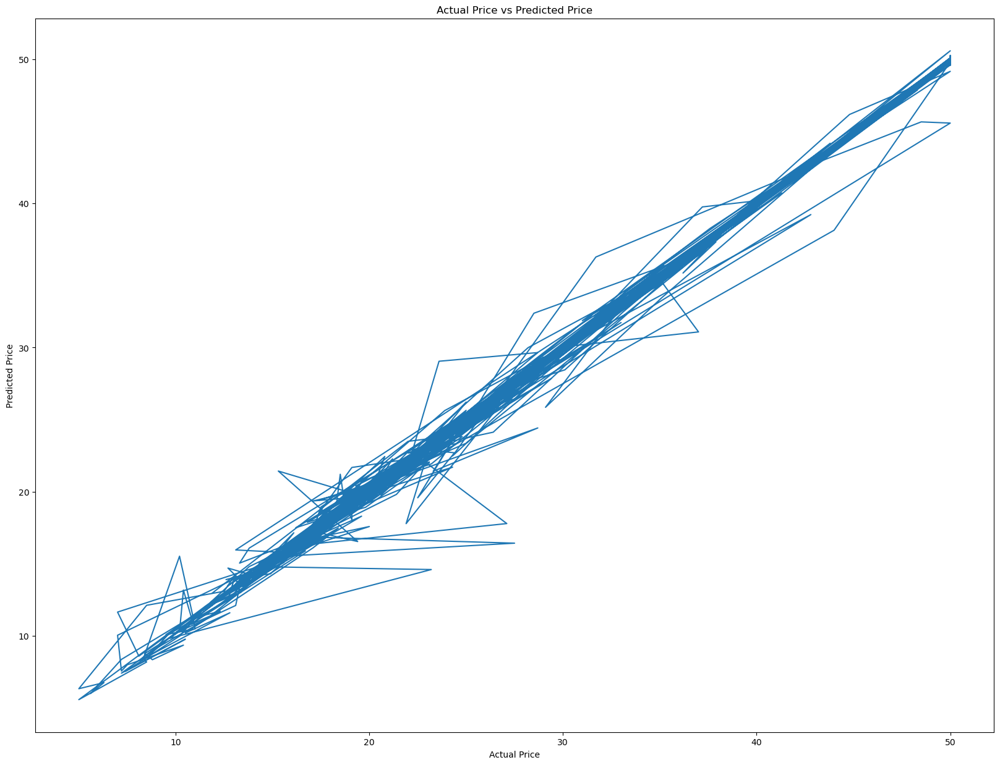

In [133]:
plt.plot(y,pred1)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual Price vs Predicted Price')
plt.savefig('Actual Price vs Predicted Price.png')
plt.show()

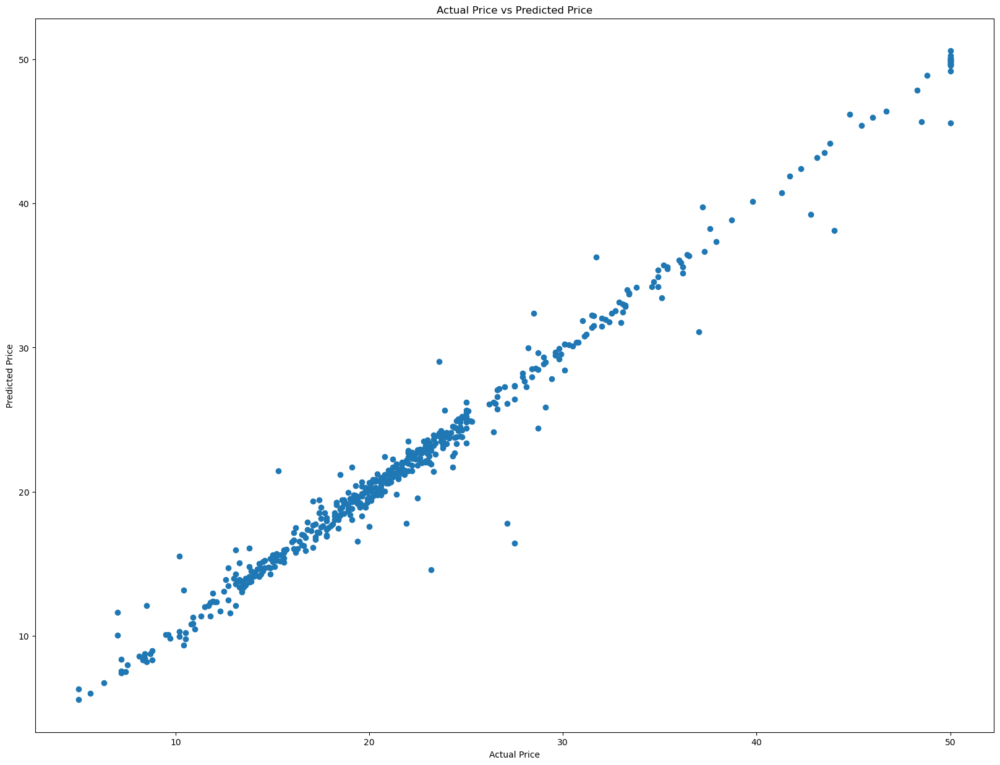

In [137]:
plt.scatter(y,pred1)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual Price vs Predicted Price')
plt.savefig('Actual Price vs Predicted Price.png')
plt.show()